## Notebook16a

In [1]:
! wget -q -nc https://raw.githubusercontent.com/taylor-arnold/fds-py/refs/heads/main/funs.py

In [2]:
import numpy as np
import polars as pl

from funs import *
from plotnine import *
from polars import col as c
theme_set(theme_minimal())

ub = "https://raw.githubusercontent.com/taylor-arnold/fds-py-nb/refs/heads/main/"

In [3]:
country = pl.read_csv(ub + "data/countries.csv")

**Research Question(s)**: How much does the choice of a map projection effect the measurement of polygon areas? How distorted are the perceptions that people may have if their mental image of the world comes from popular map projections such as Web Mercator (used in most online interactive maps, including ours)?

### US State Regions: Projections

Let's start by looking at the United States before moving to data from the entire world. We can read the state's dataset that we used in the notes using the following code.

In [4]:
state = DSGeo.read_file(ub + "data/acs_state.geojson")
state

/content/funs.py:1527: UserWarning: Geometry column does not contain geometry.


name,abb,fips,geometry
str,str,str,binary
"""Maine""","""ME""","""23""","b""\x01\x06\x00\x00\x00\x01\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00C\x00\x00\x00\x93\x15\xa7Z\x0b\xadQ\xc0\x10>yX\xa8\x87E@y\x15\x8cJ\xea\xb4Q\xc0\xb4\xe3\xa2ZD\x90E@\xda\xe2p\xe6W\xb4""…"
"""New Hampshire""","""NH""","""33""","b""\x01\x06\x00\x00\x00\x01\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00!\x00\x00\x00\xeb\x1ag\xd3\x11\xe0Q\xc0a\xc2hV\xb6\x81F@4\x85\xb2\xf0\xf5\xd9Q\xc0#\x88f\x9e\\x99F@`\xc7G\x8b3\xd2""…"
"""Delaware""","""DE""","""10""","b""\x01\x06\x00\x00\x00\x01\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00\x10\x00\x00\x00ip[[x\xf2R\xc0\x1a\x1aO\x04q\xdcC@\x1dr3\xdc\x80\xe7R\xc0X8I\xf3\xc7\xeaC@\xfe\xf34`\x90\xda""…"
"""South Carolina""","""SC""","""45""","b""\x01\x06\x00\x00\x00\x01\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x009\x00\x00\x00y\x89\x94f\xf3\xc6T\xc0\x8e\xb9\x17\x98\x15\x80A@\x9cI\xb7%r\x9dT\xc0s\x81\xcbc\xcd\x96A@\xda`S\xe7Q\x8b""…"
"""Nebraska""","""NE""","""31""","b""\x01\x06\x00\x00\x00\x01\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00.\x00\x00\x00\x18\xe2\xc9nf\x03Z\xc0;\xefU+\x13\x80E@R\xf3U\xf2\xb1\xb2Y\xc0\xb9S:X\xff\x7fE@\xb7\x93\x16.\xabm""…"
…,…,…,…
"""Florida""","""FL""","""12""","b""\x01\x06\x00\x00\x00\x01\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00t\x00\x00\x00Z\xd1\x90\xf1(@U\xc0%\xb2\x0f\xb2,\x00?@\x90rL\x16\xf7;U\xc0\x1du\xacRz\xe2>@)7\x19U\x86:""…"
"""Alaska""","""AK""","""02""","b""\x01\x06\x00\x00\x00\x01\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00k\x02\x00\x009\xaf\xce1\x20\x04e\xc0\x16\xa3\xae\xb5\xf7iP@\xa1\x16-@[\xffd\xc0\xc7\x19\xdf\x17\x97nP@k\x90e\xc1D\xf1""…"
"""New Jersey""","""NJ""","""34""","b""\x01\x06\x00\x00\x00\x01\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00$\x00\x00\x00T\xd9\xe8\x9c\x9f\xe0R\xc0M.\x00\x8d\xd2\xd7C@\xfe\xf34`\x90\xdaR\xc0-\x85#H\xa5\xe6C@\x8ft\xb1i\xa5\xc9""…"


Create an interactive plot of the state data, using the state `abb` codes as labels on the map. Zoom in and out a bit and notice how this should be similar to using something like Google Maps.

In [10]:
DSGeo.explore(state, tooltip=[c.abb])

Now, create a static plot of the state data using the coordinate system with CRS code equal to 3857. Verify that this looks (very) similar to the interactive plot in terms of the relative placement of each state and the relative size of Alaska (in particular) to the rest of the country.

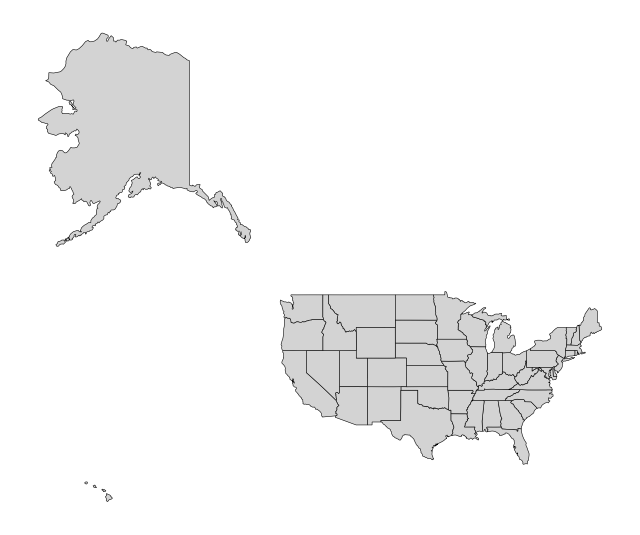

<Axes: >

In [9]:
DSGeo.plot(state, crs=3857)

Now, let's try some other projects (using static plots for each). Take a moment to compare what they look like here. We'll do a quantitative analysis in the next section. To start, use the crs code 5069, a Conus Albers projection particularly suited for the contiguous United States. Notice that it has a more "rounded" look and makes the size of Alaska relative to the rest of the US smaller (and more accurate).

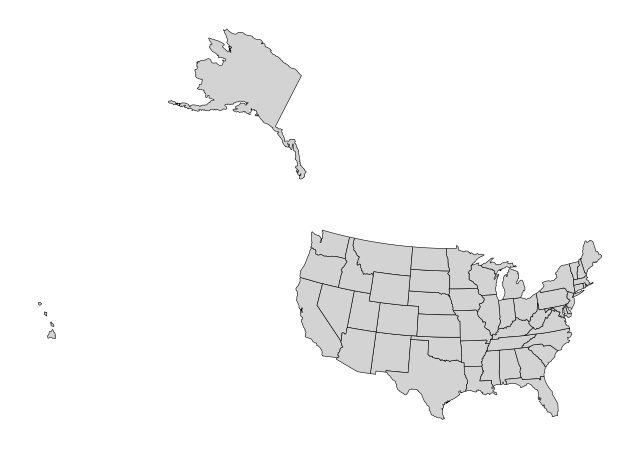

<Axes: >

In [11]:
DSGeo.plot(state, crs=5069)

Next use 6875, a projection used to be particularly accurate for Italy. Notice how the plot looks in comparison to the one above. You should see that it rotates the entire plot. If you can find a globe (or use something like Google Earth), it might help explain what's going on here.

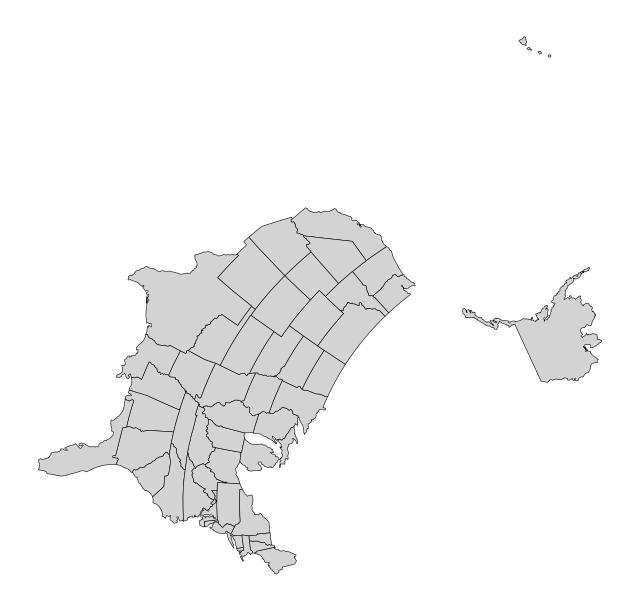

<Axes: >

In [12]:
DSGeo.plot(state, crs=6875)

Let's go even farther on the other side of the world. Use the crs code 24378, designed to be centered on India. This will look particularly strange for some parts of the country.

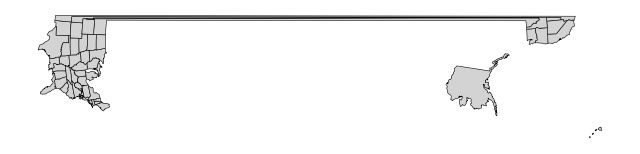

<Axes: >

In [13]:
DSGeo.plot(state, crs=24378)

And, continuing around the world, let's do 27200, which corresponds to the New Zealand Map Grid. This is should look very weird.

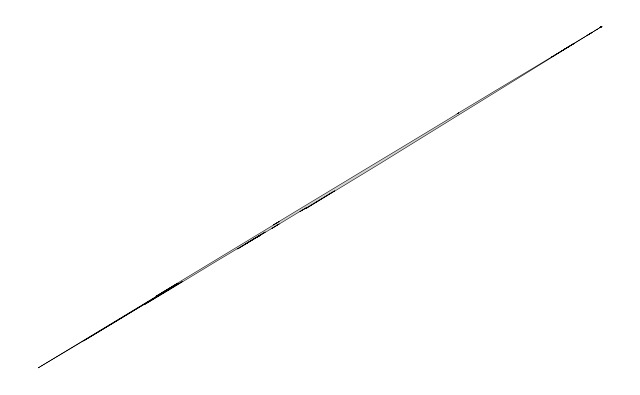

<Axes: >

In [14]:
DSGeo.plot(state, crs=27200)

Finally, let's use the code "ESRI:54009" (make sure you put in quotes and use the prefix as well). This is the Mollweide projection, which is an equal-area projection of the world. It should produce relatively reasonable estimates of area for nearly every area of the world.

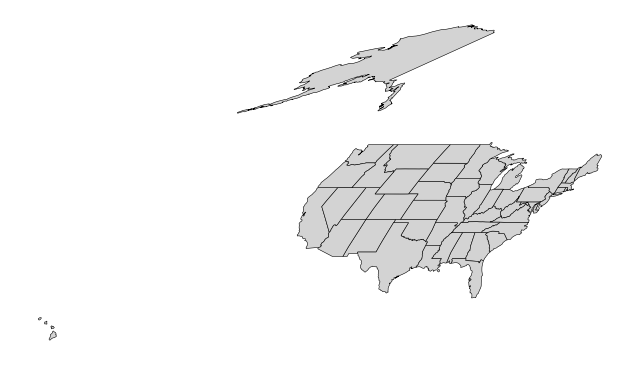

<Axes: >

In [15]:
DSGeo.plot(state, crs="ESRI:54009")

After taking a look at the project, can you see why we don't just always use the Mollweide for all analyses, even though it does a good job of computing areas everywhere?

### US State Regions: Projection Area

Next, we will actually compute the area of each of the regions in our dataset. We have a helper function to do this in `DSGeo.add_area`. We can put this directly inside of the `.with_columns` method to add a column to our dataset. Here is an example of how this works with the Mollweide projection, which we will treat as the "actual" area of each region in the following analyses.

In [5]:
(
    state
    .drop(c.geometry)
    .with_columns(
        area = DSGeo.add_area(state, crs="ESRI:54009")['area']
    )
)

name,abb,fips,area
str,str,str,f64
"""Maine""","""ME""","""23""",85243.38409
"""New Hampshire""","""NH""","""33""",24080.442855
"""Delaware""","""DE""","""10""",5157.628668
"""South Carolina""","""SC""","""45""",81060.872863
"""Nebraska""","""NE""","""31""",200302.474916
…,…,…,…
"""Florida""","""FL""","""12""",150265.071348
"""Alaska""","""AK""","""02""",1.4936e6
"""New Jersey""","""NJ""","""34""",20184.197232


Now, create a dataset that has the area defined by the Mollweide projection as well as the area from the projection 3857 (Web Mercator). Then, compute the relative error of the projection, treating the Mollweide projection as the correct area, using the formula for relative error: | real - estimated | / real. Sort by the relative errors and look at the states that have the highest errors.

In [21]:
(
    state
    .drop(c.geometry)
    .with_columns(
        area = DSGeo.add_area(state, crs="ESRI:54009")['area'],
        web_area = DSGeo.add_area(state, crs=3857)['area']
    )
    .with_columns(
        relative_error = (abs(c.area - c.web_area) / c.area)
    )
    .sort(c.relative_error, descending=True)
)

name,abb,fips,area,web_area,relative_error
str,str,str,f64,f64,f64
"""Alaska""","""AK""","""02""",1.4936e6,7.9864e6,4.346965
"""North Dakota""","""ND""","""38""",182816.811246,400408.932944,1.190219
"""Washington""","""WA""","""53""",174663.097001,380680.905171,1.179515
"""Montana""","""MT""","""30""",380808.037078,820060.556015,1.153475
"""Minnesota""","""MN""","""27""",218343.878226,458726.74607,1.100937
…,…,…,…,…,…
"""Georgia""","""GA""","""13""",153189.708063,216450.325089,0.412956
"""Texas""","""TX""","""48""",689753.691872,950664.606687,0.378267
"""Louisiana""","""LA""","""22""",122238.637623,166659.694898,0.363396


Repeat the analysis that you have above with the 24378 projection (India). Take a careful look at the states with the highest errors and look back to the plot to see why these are the most distorted.

In [22]:
(
    state
    .drop(c.geometry)
    .with_columns(
        area = DSGeo.add_area(state, crs="ESRI:54009")['area'],
        web_area = DSGeo.add_area(state, crs=24378)['area']
    )
    .with_columns(
        relative_error = (abs(c.area - c.web_area) / c.area)
    )
    .sort(c.relative_error, descending=True)
)

name,abb,fips,area,web_area,relative_error
str,str,str,f64,f64,f64
"""Montana""","""MT""","""30""",380808.037078,1.9814e6,4.203046
"""Utah""","""UT""","""49""",218163.945426,964049.926012,3.418924
"""Arizona""","""AZ""","""04""",298022.040404,1.0133e6,2.400103
"""Alaska""","""AK""","""02""",1.4936e6,2.1542e6,0.442217
"""Idaho""","""ID""","""16""",216447.146363,127619.647878,0.410389
…,…,…,…,…,…
"""North Carolina""","""NC""","""37""",129879.487508,129625.724149,0.001954
"""Oklahoma""","""OK""","""40""",181443.088531,181180.208993,0.001449
"""Tennessee""","""TN""","""47""",109372.949001,109216.212324,0.001433


Now, create a visualization of the area (x axis) compared to the area defined by the projection 3857 (Web Mercator; y axis). Include both points and the abbreviations of the states using `geom_text_repel`. Also, include a line to see where the two calculations are equal with `+ geom_abline(linetype="dashed")`.

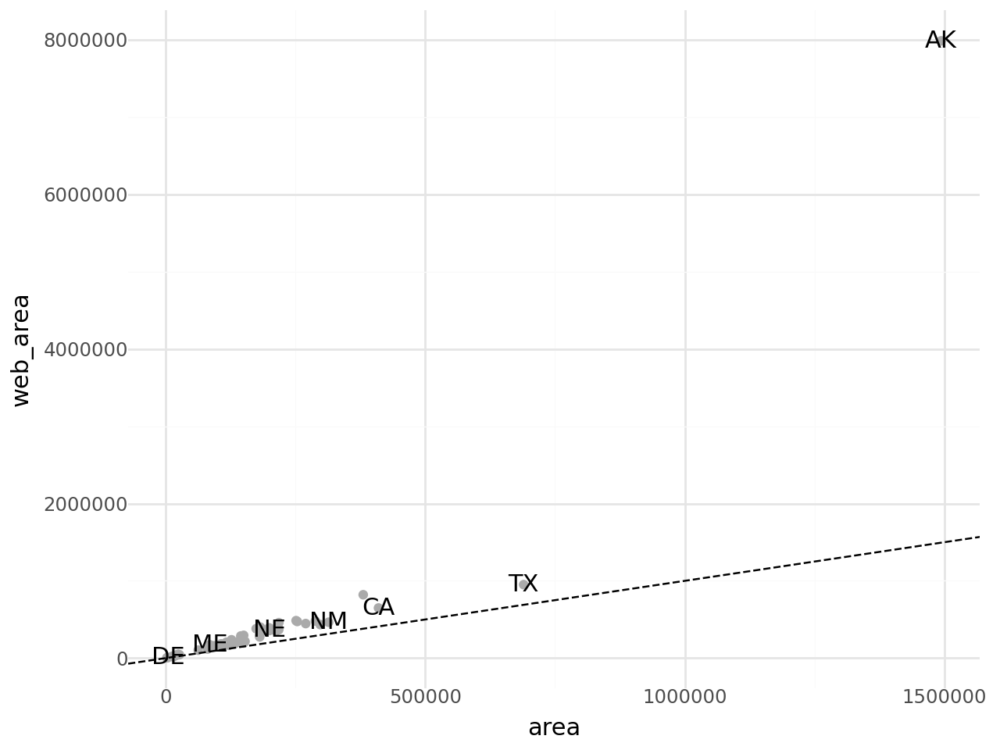

In [32]:
(
    state
    .drop(c.geometry)
    .with_columns(
        area = DSGeo.add_area(state, crs="ESRI:54009")['area'],
        web_area = DSGeo.add_area(state, crs=3857)['area']
    )
    .with_columns(
        relative_error = (abs(c.area - c.web_area) / c.area)
    )
    .pipe(ggplot, aes("area", "web_area"))
    + geom_point(color="#AAAAAA")
    + geom_text_repel(aes(label="abb"))
    + geom_abline(linetype="dashed")
)

### Countries

Next, we will move to a dataset of countries. Use the code below to read the GeoJSON file that has the official borders for all of the world countries.

In [33]:
country_geo = DSGeo.read_file(ub + "data/countries_polygons.geojson")
country_geo

/content/funs.py:1527: UserWarning: Geometry column does not contain geometry.


iso,iso_a2,name,geometry
str,str,str,binary
"""AFG""","""AF""","""Afghanistan""","b""\x01\x06\x00\x00\x00\x01\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00\xaf\x03\x00\x00\x00\x00\x00\x90b\xbfQ@\x95\xb2\x08\x11\xd3>C@\x00\x00\x00\x20\xc5\xbdQ@\xea\x9b]\xed\xfb<C@\x00\x00\x00\x00\x9b\xbc""…"
"""ALB""","""AL""","""Albania""","b""\x01\x06\x00\x00\x00\x02\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00\x8a\x01\x00\x00\x00\x00\x00\x00p\xb83@\x99\x81N$\x82TE@\x00\x00\x00\x00\x98\xae3@yF^\xc5gQE@\x00\x00\x00\x00\xf8\xa8""…"
"""DZA""","""DZ""","""Algeria""","b""\x01\x06\x00\x00\x00\x03\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00\xda\x02\x00\x00\x00\x00\x00\x00p\xdc\x1c@\xfc~U\xfa\x8c\x8bB@\x01\x00\x00\x00P\xc0\x1c@\xfb\x96\xdec\xfd\x8aB@\xff\xff\xff\xff\xff\xa6""…"
"""AND""","""AD""","""Andorra""","b""\x01\x06\x00\x00\x00\x01\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00f\x00\x00\x00\x80\x0c\xd0\x89\x0a\xca\xf8?\xe8.#\xd2\xd7SE@\xff\xff\xff\xff?z\xf8?\xbf\xe6\x85\xa4&SE@\x80/\xa0\x13\x05c""…"
"""AGO""","""AO""","""Angola""","b""\x01\x06\x00\x00\x00\x03\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00\xac\x02\x00\x00\x14\x00\x00\x00da,@\xc0Y%\xef\xa6O\x17\xc0\x10\x00\x00\x00\xd4\x0f,@\x84\x03\xc5H\xa4]\x17\xc0\x11\x00\x00\x00T\xf9""…"
…,…,…,…
"""VNM""","""VN""","""Vietnam""","b""\x01\x06\x00\x00\x001\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x008\x06\x00\x00\x04\x00\x00\x00\xafTZ@\x7fw\x80\x99\xe1c7@\x04\x00\x00\x80|RZ@\x9a\xe1\xcd`\xd8Z7@\x00\x00\x00\x009R""…"
"""ESH""","""EH""","""Western Sahara""","b""\x01\x06\x00\x00\x00\x01\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00!\x00\x00\x00O\x04g6\x86c*\xc053\xb6\xb6\xe2\xae;@p\xf8\xb0\x1c\x91\xe2*\xc0l\x04\x03s\xe4H;@\xf0\xe4qg\xb0D""…"
"""YEM""","""YE""","""Yemen""","b""\x01\x06\x00\x00\x003\x00\x00\x00\x01\x03\x00\x00\x00\x01\x00\x00\x00\xb2\x00\x00\x00\x10\xc5H\x99\x08\x00J@\x03\xb3\xbd\xb0\xee\xff2@\x00\x00\x00\x00\xe0`I@\xe9[\xe4z\x11\xc82@\x00\x00\x00\x00\xa4\x8e""…"


Create an interactive visualize of the data, using the name as the tooltip. Scroll in and out a bit to get a sense for how it works. Pay attention to a couple of things: (1) Zoom into a border; the one between Italy and France is a good exam, and compare our borders to those shown on the map, (2) look at Russia and see how the data treats parts of the country that extend across the +/- 180 degrees longitude.

In [36]:
DSGeo.explore(country_geo, tooltip=[c.name])

Now, pick a country, and use the following code to find its region in the country dataset.

In [37]:
(
    country.filter(c.iso == "CHN")
)

iso,full_name,region,subregion,pop,lexp,lat,lon,hdi,gdp,gini,happy,cellphone,water_access,lang
str,str,str,str,f64,f64,f64,f64,f64,i64,f64,f64,f64,f64,str
"""CHN""","""China""","""Asia""","""Eastern Asia""",1416.096,78.81,35.844722,103.451944,0.797,25505,38.2,61.45,63.6,88.06831,"""cmn"""


Next, look up a projection specifically designed for it using the look-up tool on https://epsg.io/. We want to create a static map of the countries using this projection, however, we won't be able to compute the entire world with this projection (countries on the other side of the globe will be so distored the algorithm will refuse the run). So instead, select only those countries that are in the same region as your country of choice. Note: You'll need a join for this.

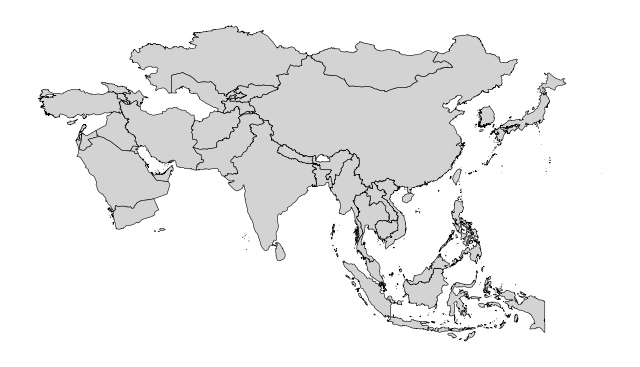

<Axes: >

In [46]:
(
    country_geo
    .join(country.filter(c.region == "Asia"), on="iso")
    .pipe(DSGeo.plot, crs=4480)
)

Recreate the plot you had in the previous section of this notebook to show the visualization of the area (x axis) compared to the area defined by the projection 3857 (Web Mercator; y axis). Take a close look at the outliers.

/usr/local/lib/python3.12/dist-packages/shapely/measurement.py:50: RuntimeWarning: invalid value encountered in area
/usr/local/lib/python3.12/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 12 rows containing missing values.
/usr/local/lib/python3.12/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_text_repel : Removed 12 rows containing missing values.


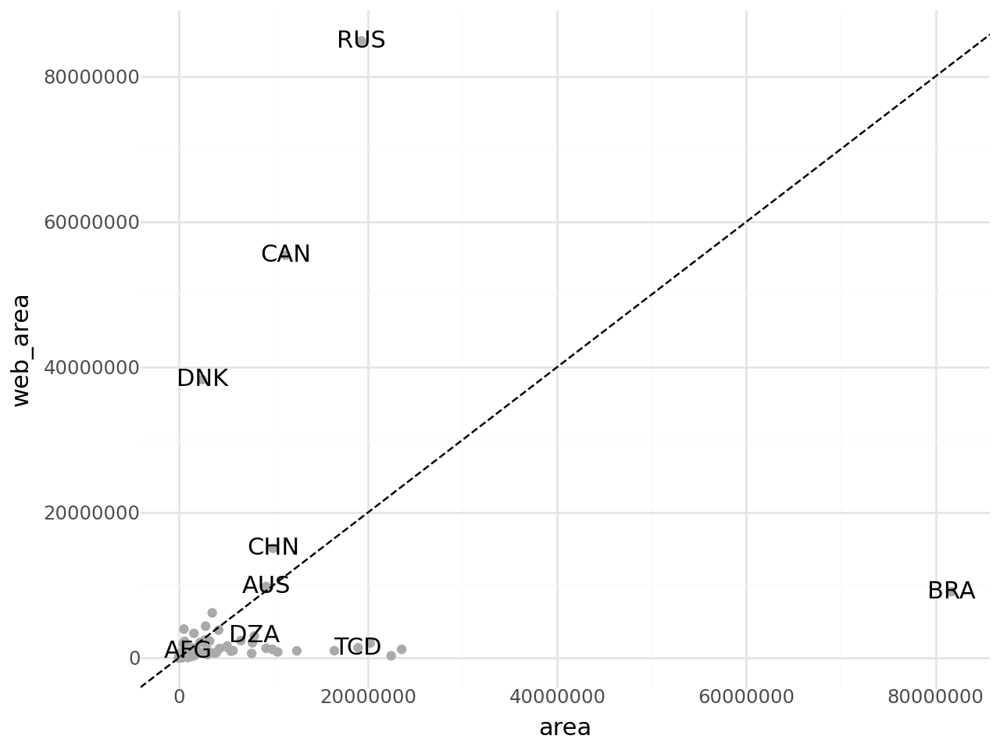

In [57]:
(
    country_geo
    .drop(c.geometry)
    .with_columns(
        area = DSGeo.add_area(country_geo, crs=32649)['area'],
        web_area = DSGeo.add_area(country_geo, crs=3857)['area']
    )
    .pipe(ggplot, aes("area", "web_area"))
    + geom_point(color="#AAAAAA")
    + geom_text_repel(aes(label="iso"))
    + geom_abline(linetype="dashed")
)

Now, compute the relative error of the two measurements (using Mollweide projection as the correct measurment). Create a plot showing the relative errors for the highest 20 errors using `geom_col`. Try to make the plot look nice.

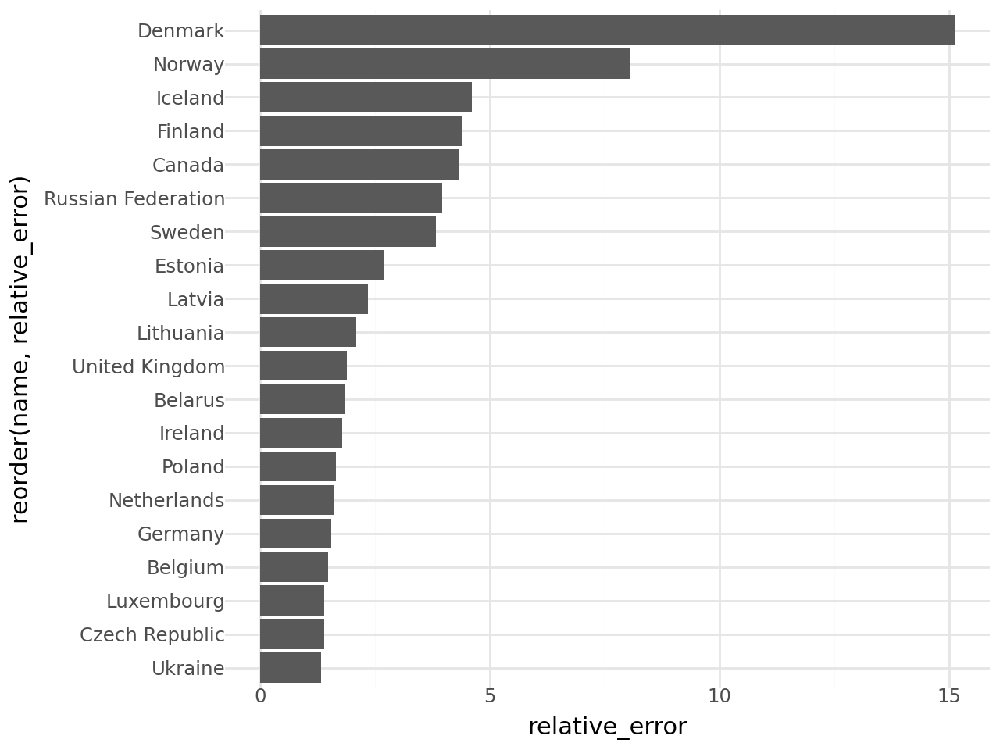

In [62]:
(
    country_geo
    .drop(c.geometry)
    .with_columns(
        area = DSGeo.add_area(country_geo, crs="ESRI:54009")['area'],
        web_area = DSGeo.add_area(country_geo, crs=3857)['area']
    )
    .with_columns(
        relative_error = (abs(c.area - c.web_area) / c.area)
    )
    .sort(c.relative_error, descending=True)
    .head(20)
    .pipe(ggplot, aes("reorder(name, relative_error)", "relative_error"))
    + geom_col()
    + coord_flip()
)

Finally, compute the average relative error by subregion in the data. Use a `geom_col` layer to visualize the errors. Try to make the plot look nice.

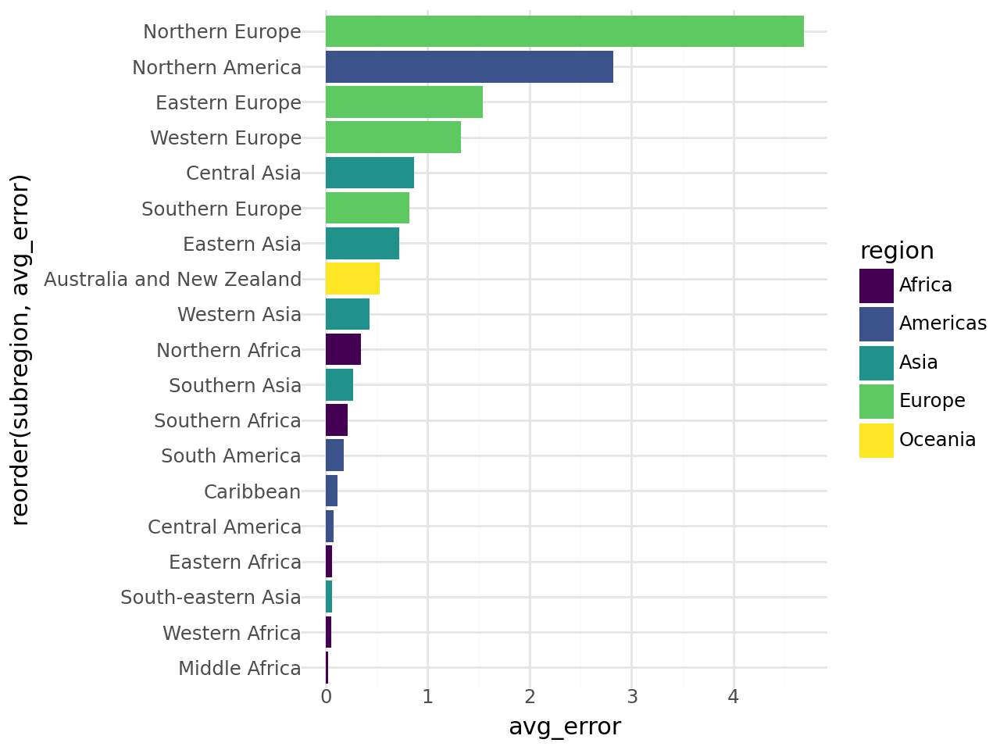

In [67]:
(
    country_geo
    .drop(c.geometry)
    .with_columns(
        area = DSGeo.add_area(country_geo, crs="ESRI:54009")['area'],
        web_area = DSGeo.add_area(country_geo, crs=3857)['area']
    )
    .with_columns(
        relative_error = (abs(c.area - c.web_area) / c.area)
    )
    .join(country, on="iso")
    .group_by(c.region, c.subregion)
    .agg(
        avg_error = c.relative_error.mean()
    )
    .pipe(ggplot, aes("reorder(subregion, avg_error)", "avg_error"))
    + geom_col(aes(fill="region"))
    + coord_flip()
    + scale_fill_cmap_d()
)